# Pathway Activities  

Here we infer Pathway activities from our spatial transcriptomics data using PROGENy model. 

PROGENy is a comprehensive resource containing a curated collection of pathways and their target genes, with weights for each interaction. For this example we will use the human weights (other organisms are available) and we will use the top 500 responsive genes ranked by p-value. Here is a brief description of each pathway:

**Androgen**: involved in the growth and development of the male reproductive organs.

**EGFR**: regulates growth, survival, migration, apoptosis, proliferation, and differentiation in mammalian cells

**Estrogen**: promotes the growth and development of the female reproductive organs.

**Hypoxia**: promotes angiogenesis and metabolic reprogramming when O2 levels are low.

**JAK-STAT**: involved in immunity, cell division, cell death, and tumor formation.

**MAPK**: integrates external signals and promotes cell growth and proliferation.

**NFkB**: regulates immune response, cytokine production and cell survival.

**p53**: regulates cell cycle, apoptosis, DNA repair and tumor suppression.

**PI3K**: promotes growth and proliferation.

**TGFb**: involved in development, homeostasis, and repair of most tissues.

**TNFa**: mediates haematopoiesis, immune surveillance, tumour regression and protection from infection.

**Trail**: induces apoptosis.

**VEGF**: mediates angiogenesis, vascular permeability, and cell migration.

**WNT**: regulates organ morphogenesis during development and tissue repair.

### Load packages  

Environment ``liana``

In [1]:
# Generic
import pandas as pd
import numpy as np

# single cell
import scanpy as sc
import squidpy as sq
import decoupler as dc
import plotnine as p9
import liana as li
import anndata as ad

### Load and normalize data

In [2]:
folder = '/lustre/groups/ml01/workspace/sara.jimenez/spatial_pancreas_data/preprocessed_data/data4downstream/'
files   = ['s1_covet_niche_def_corr_per_fov.h5ad','s2_covet_niche_def_corr_per_fov.h5ad','s3_covet_niche_def_corr_per_fov.h5ad']

s1 = sc.read_h5ad(folder+files[0])
#s1.obs["fov"] = s1.obs["fov"].astype(str) + "_s1"
s2 = sc.read_h5ad(folder+files[1])
#s2.obs["fov"] = s2.obs["fov"].astype(str) + "_s2"
s3 = sc.read_h5ad(folder+files[2])
#s3.obs["fov"] = s3.obs["fov"].astype(str) + "_s3"

adata = ad.concat([s1, s2, s3], join='outer',uns_merge='same',axis=0,pairwise=True) 
del s1 
del s2
del s3
adata

/home/aih/sara.jimenez/miniconda3/envs/liana/lib/python3.9/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


AnnData object with n_obs × n_vars = 386727 × 979
    obs: 'fov', 'Area', 'AspectRatio', 'CenterX_global_px', 'CenterY_global_px', 'Width', 'Height', 'Mean.MembraneStain', 'Max.MembraneStain', 'Mean.PanCK', 'Max.PanCK', 'Mean.GCG', 'Max.GCG', 'Mean.CD3', 'Max.CD3', 'Mean.DAPI', 'Max.DAPI', 'cell_ID', 'condition', 'slide', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_NegPrb', 'log1p_total_counts_NegPrb', 'pct_counts_NegPrb', 'n_genes', 'cell_type_coarse', 'CellTypes_max', 'donor', 'cell_type', 'leiden_covet_0.2', 'Niche_label'
    uns: 'CellTypes_max_colors', 'Niche_label_colors', 'cell_type_coarse_colors', 'hvg', 'leiden_covet_0.2', 'n_neighbors=30', 'neighbors', 'pca', 'spatial'
    obsm: 'X_pca', 'X_umap', 'covet-n_neighbors=30', 'covet_sqrt-n_neighbors=30', 'covet_sqrt_flat-n_neighbors=30', 'spatial', 'spati

In [3]:
adata.X.max(),adata.layers['counts'].max()

(122.07407, 325)

The data is already normalized

### Spatial neighbors

In [4]:
adata.obs['fov_unique'] = adata.obs.fov.astype(str) + '_' + adata.obs.slide.astype(str)
adata.obs.fov_unique.unique()

array(['1_Run5211_S1', '2_Run5211_S1', '3_Run5211_S1', '4_Run5211_S1',
       '5_Run5211_S1', '6_Run5211_S1', '7_Run5211_S1', '8_Run5211_S1',
       '9_Run5211_S1', '10_Run5211_S1', '11_Run5211_S1', '12_Run5211_S1',
       '13_Run5211_S1', '14_Run5211_S1', '15_Run5211_S1', '16_Run5211_S1',
       '17_Run5211_S1', '18_Run5211_S1', '19_Run5211_S1', '20_Run5211_S1',
       '21_Run5211_S1', '22_Run5211_S1', '23_Run5211_S1', '24_Run5211_S1',
       '1_Run5211_S2', '2_Run5211_S2', '3_Run5211_S2', '4_Run5211_S2',
       '5_Run5211_S2', '6_Run5211_S2', '7_Run5211_S2', '8_Run5211_S2',
       '9_Run5211_S2', '10_Run5211_S2', '11_Run5211_S2', '12_Run5211_S2',
       '13_Run5211_S2', '14_Run5211_S2', '15_Run5211_S2', '16_Run5211_S2',
       '17_Run5211_S2', '18_Run5211_S2', '19_Run5211_S2', '20_Run5211_S2',
       '21_Run5211_S2', '22_Run5211_S2', '1_Run5211_S3', '2_Run5211_S3',
       '3_Run5211_S3', '4_Run5211_S3', '5_Run5211_S3', '6_Run5211_S3',
       '7_Run5211_S3', '8_Run5211_S3', '9_Run5211

In [5]:
adata.obs['fov_unique'] = adata.obs['fov_unique'].astype('category')

In [6]:
sq.gr.spatial_neighbors(adata, spatial_key='spatial',library_key='fov_unique',n_neighs=30)#,delaunay=True)
adata

AnnData object with n_obs × n_vars = 386727 × 979
    obs: 'fov', 'Area', 'AspectRatio', 'CenterX_global_px', 'CenterY_global_px', 'Width', 'Height', 'Mean.MembraneStain', 'Max.MembraneStain', 'Mean.PanCK', 'Max.PanCK', 'Mean.GCG', 'Max.GCG', 'Mean.CD3', 'Max.CD3', 'Mean.DAPI', 'Max.DAPI', 'cell_ID', 'condition', 'slide', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_NegPrb', 'log1p_total_counts_NegPrb', 'pct_counts_NegPrb', 'n_genes', 'cell_type_coarse', 'CellTypes_max', 'donor', 'cell_type', 'leiden_covet_0.2', 'Niche_label', 'fov_unique'
    uns: 'CellTypes_max_colors', 'Niche_label_colors', 'cell_type_coarse_colors', 'hvg', 'leiden_covet_0.2', 'n_neighbors=30', 'neighbors', 'pca', 'spatial', 'spatial_neighbors'
    obsm: 'X_pca', 'X_umap', 'covet-n_neighbors=30', 'covet_sqrt-n_neighbors=30', 'covet_sqrt_flat

### Pathway activity inference with progeny model

In [7]:
progeny = dc.get_progeny(organism='human', top=500)
progeny

/home/aih/sara.jimenez/miniconda3/envs/liana/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
Failed to download from `https://omnipathdb.org/`.
Traceback (most recent call last):
  File "/home/aih/sara.jimenez/miniconda3/envs/liana/lib/python3.9/site-packages/urllib3/connectionpool.py", line 715, in urlopen
    httplib_response = self._make_request(
  File "/home/aih/sara.jimenez/miniconda3/envs/liana/lib/python3.9/site-packages/urllib3/connectionpool.py", line 404, in _make_request
    self._validate_conn(conn)
  File "/home/aih/sara.jimenez/miniconda3/envs/liana/lib/python3.9/site-packages/urllib3/connectionpool.py", line 1058, in _validate_conn
    conn.connect()
  File "/home/aih/sara.jimenez/miniconda3/envs/liana/lib/python3.9/site-packages/urllib3/connection.py", line 419, in connect
    self.sock = ssl_wrap_socket(
  File "/home/aih/sara.jimenez/

,source,target,weight,p_value
0,Androgen,TMPRSS2,11.490631,0.000000e+00
1,Androgen,NKX3-1,10.622551,2.242078e-44
2,Androgen,MBOAT2,10.472733,4.624285e-44
3,Androgen,KLK2,10.176186,1.944414e-40
4,Androgen,SARG,11.386852,2.790209e-40
...,...,...,...,...
6995,p53,ZMYM4,-2.325752,1.522388e-06
6996,p53,CFDP1,-1.628168,1.526045e-06
6997,p53,VPS37D,2.309503,1.537098e-06
6998,p53,TEDC1,-2.274823,1.547037e-06


In [8]:
dc.run_mlm(
    mat=adata,
    net=progeny,
    source='source',
    target='target',
    weight='weight',
    verbose=True,
    use_raw=False
)

# Store in new obsm keys
adata.obsm['progeny_mlm_estimate'] = adata.obsm['mlm_estimate'].copy()
adata.obsm['progeny_mlm_pvals'] = adata.obsm['mlm_pvals'].copy()

Running mlm on mat with 386727 samples and 979 targets for 14 sources.


In [9]:
adata.obsm['progeny_mlm_estimate']

,Androgen,EGFR,Estrogen,Hypoxia,JAK-STAT,MAPK,NFkB,PI3K,TGFb,TNFa,Trail,VEGF,WNT,p53
1_1,-0.316514,-0.063288,-0.172262,-0.295908,-0.579198,-0.076100,-0.630676,-0.080674,-0.678870,0.574733,-0.321878,-0.397010,-0.050659,-0.133020
2_1,-0.091632,-0.437252,-0.256068,0.214507,-0.548514,0.107642,-0.475094,-0.526414,-0.537497,0.346131,-0.406054,-0.410894,-0.313259,-0.078826
3_1,-0.170960,-0.102113,0.123060,-0.216852,-0.452570,-0.014316,-0.305343,-0.093011,-0.296219,0.076913,-0.151586,-0.063455,-0.114908,-0.353281
4_1,0.094200,-0.332058,0.032323,-0.421911,-0.353295,0.349005,-0.229292,-0.128539,-0.644243,0.089292,-0.478087,0.186830,-0.088474,-0.057262
5_1,-0.122373,-0.070003,-0.046681,-0.185970,-0.224189,0.252469,-0.468615,-0.220700,0.085337,0.349793,-0.101462,-0.314343,-0.087227,-0.173160
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7236_25,-0.455444,0.975392,1.239502,0.388609,1.540332,-1.009568,-0.980569,-0.024991,-0.229062,0.959031,-0.247906,0.164397,-0.138385,-0.385985
7237_25,-0.168888,-0.227879,-0.056194,-0.227703,-0.367181,0.041207,-0.146308,-0.013163,-0.348279,-0.067688,0.446773,0.137267,-0.131116,-0.201912
7239_25,-0.200036,0.548549,1.155704,-0.215099,0.092564,-0.147892,-0.619587,-0.007132,-0.399545,0.755192,-0.164291,0.122391,-0.050325,-0.225755
7240_25,-0.371726,0.177131,-0.089620,-0.211283,-0.528910,0.367185,-0.828717,-1.159929,-0.015529,1.507414,-0.369232,-2.416024,-0.061437,-0.272772


In [11]:
adata

AnnData object with n_obs × n_vars = 386727 × 979
    obs: 'fov', 'Area', 'AspectRatio', 'CenterX_global_px', 'CenterY_global_px', 'Width', 'Height', 'Mean.MembraneStain', 'Max.MembraneStain', 'Mean.PanCK', 'Max.PanCK', 'Mean.GCG', 'Max.GCG', 'Mean.CD3', 'Max.CD3', 'Mean.DAPI', 'Max.DAPI', 'cell_ID', 'condition', 'slide', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_NegPrb', 'log1p_total_counts_NegPrb', 'pct_counts_NegPrb', 'n_genes', 'cell_type_coarse', 'CellTypes_max', 'donor', 'cell_type', 'leiden_covet_0.2', 'Niche_label', 'fov_unique'
    uns: 'CellTypes_max_colors', 'Niche_label_colors', 'cell_type_coarse_colors', 'hvg', 'leiden_covet_0.2', 'n_neighbors=30', 'neighbors', 'pca', 'spatial', 'spatial_neighbors'
    obsm: 'X_pca', 'X_umap', 'covet-n_neighbors=30', 'covet_sqrt-n_neighbors=30', 'covet_sqrt_flat

### Visualization

In [12]:
acts = dc.get_acts(adata, obsm_key='progeny_mlm_estimate')
acts

/home/aih/sara.jimenez/miniconda3/envs/liana/lib/python3.9/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


AnnData object with n_obs × n_vars = 386727 × 14
    obs: 'fov', 'Area', 'AspectRatio', 'CenterX_global_px', 'CenterY_global_px', 'Width', 'Height', 'Mean.MembraneStain', 'Max.MembraneStain', 'Mean.PanCK', 'Max.PanCK', 'Mean.GCG', 'Max.GCG', 'Mean.CD3', 'Max.CD3', 'Mean.DAPI', 'Max.DAPI', 'cell_ID', 'condition', 'slide', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_NegPrb', 'log1p_total_counts_NegPrb', 'pct_counts_NegPrb', 'n_genes', 'cell_type_coarse', 'CellTypes_max', 'donor', 'cell_type', 'leiden_covet_0.2', 'Niche_label', 'fov_unique'
    uns: 'CellTypes_max_colors', 'Niche_label_colors', 'cell_type_coarse_colors', 'hvg', 'leiden_covet_0.2', 'n_neighbors=30', 'neighbors', 'pca', 'spatial', 'spatial_neighbors'
    obsm: 'X_pca', 'X_umap', 'covet-n_neighbors=30', 'covet_sqrt-n_neighbors=30', 'covet_sqrt_flat-

In [13]:
acts.obs_names_make_unique()

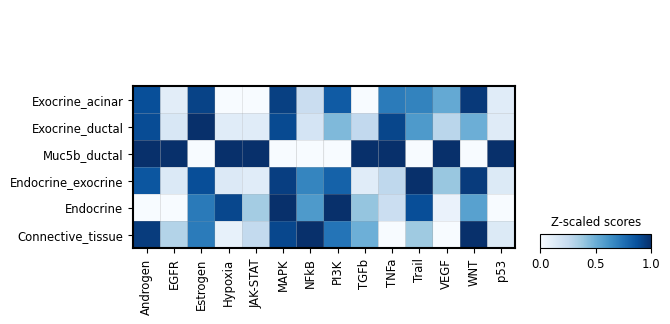

In [14]:
sc.pl.matrixplot(acts, var_names=acts.var_names, groupby='Niche_label', dendrogram=False, standard_scale='var',
                 colorbar_title='Z-scaled scores', cmap='Blues')

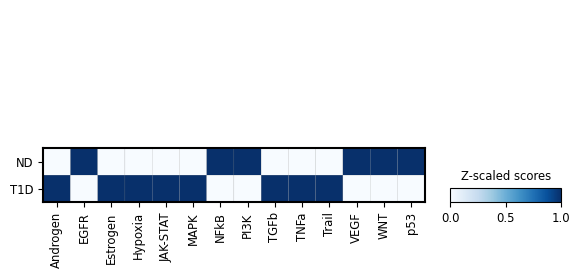

In [15]:
sc.pl.matrixplot(acts, var_names=acts.var_names, groupby='condition', dendrogram=False, standard_scale='var',
                 colorbar_title='Z-scaled scores', cmap='Blues')

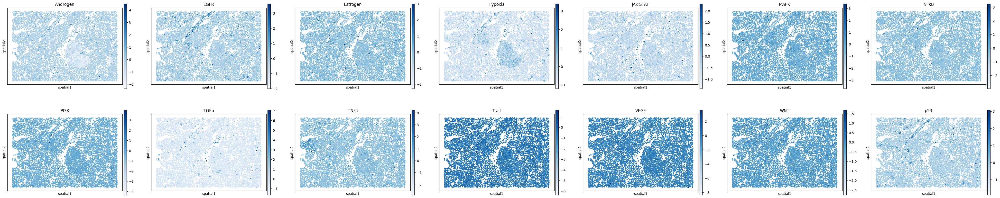

In [60]:
# Check how the TF activities look like
sq.pl.spatial_scatter(
    acts[acts.obs['fov_unique'] == '12_Run5211_S1'],
    color = acts.var_names,
    #groups = ['Endocrine'],
    spatial_key = 'spatial',
    shape=None,
    cmap='Blues',
    ncols=7,
    #vmax="p99",
)

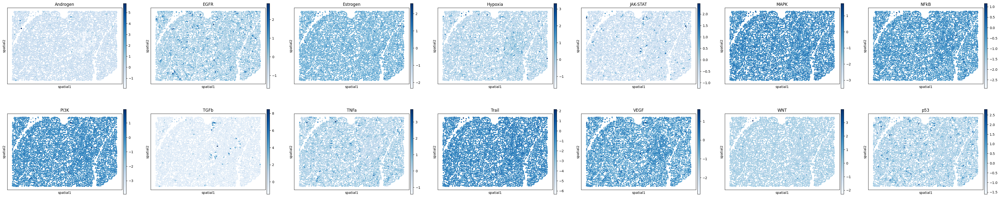

In [36]:
# Check how the TF activities look like
sq.pl.spatial_scatter(
    acts[acts.obs['fov_unique'] == '2_Run5211_S1'],
    color = acts.var_names,
    #groups = ['Endocrine'],
    spatial_key = 'spatial',
    shape=None,
    cmap='Blues',
    ncols=7,
    #vmax="p99",
)

/home/aih/sara.jimenez/miniconda3/envs/liana/lib/python3.9/site-packages/squidpy/pl/_color_utils.py:28: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
/home/aih/sara.jimenez/miniconda3/envs/liana/lib/python3.9/site-packages/squidpy/pl/_spatial_utils.py:946: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
/home/aih/sara.jimenez/miniconda3/envs/liana/lib/python3.9/site-packages/squidpy/pl/_spatial_utils.py:946: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
/home/aih/sara.jimenez/miniconda3/envs/liana/lib/python3.9/site-packages/squidpy/pl/_spatial_utils.py:946: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored


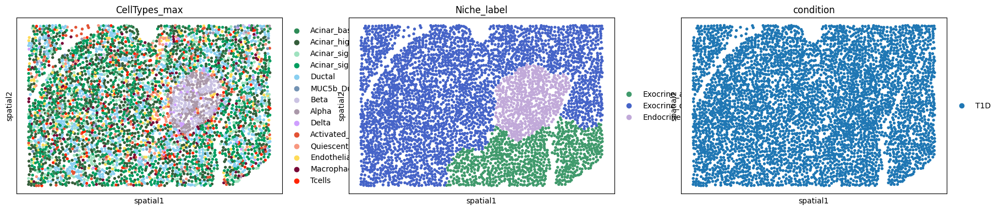

In [16]:
# Check how the TF activities look like
sq.pl.spatial_scatter(
    acts[acts.obs['fov_unique'] == '2_Run5211_S1'],
    color = ['CellTypes_max','Niche_label','condition'],
    #groups = ['Endocrine'],
    spatial_key = 'spatial',
    shape=None,
    cmap='Blues',
    ncols=7,
    #vmax="p99",
)

In [18]:
acts, adata

(AnnData object with n_obs × n_vars = 386727 × 14
     obs: 'fov', 'Area', 'AspectRatio', 'CenterX_global_px', 'CenterY_global_px', 'Width', 'Height', 'Mean.MembraneStain', 'Max.MembraneStain', 'Mean.PanCK', 'Max.PanCK', 'Mean.GCG', 'Max.GCG', 'Mean.CD3', 'Max.CD3', 'Mean.DAPI', 'Max.DAPI', 'cell_ID', 'condition', 'slide', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_NegPrb', 'log1p_total_counts_NegPrb', 'pct_counts_NegPrb', 'n_genes', 'cell_type_coarse', 'CellTypes_max', 'donor', 'cell_type', 'leiden_covet_0.2', 'Niche_label', 'fov_unique'
     uns: 'CellTypes_max_colors', 'Niche_label_colors', 'cell_type_coarse_colors', 'hvg', 'leiden_covet_0.2', 'n_neighbors=30', 'neighbors', 'pca', 'spatial', 'spatial_neighbors'
     obsm: 'X_pca', 'X_umap', 'covet-n_neighbors=30', 'covet_sqrt-n_neighbors=30', 'covet_sqrt_f

In [19]:
acts.obsp['spatial_connectivities'] = adata.obsp['spatial_connectivities']
acts

AnnData object with n_obs × n_vars = 386727 × 14
    obs: 'fov', 'Area', 'AspectRatio', 'CenterX_global_px', 'CenterY_global_px', 'Width', 'Height', 'Mean.MembraneStain', 'Max.MembraneStain', 'Mean.PanCK', 'Max.PanCK', 'Mean.GCG', 'Max.GCG', 'Mean.CD3', 'Max.CD3', 'Mean.DAPI', 'Max.DAPI', 'cell_ID', 'condition', 'slide', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_NegPrb', 'log1p_total_counts_NegPrb', 'pct_counts_NegPrb', 'n_genes', 'cell_type_coarse', 'CellTypes_max', 'donor', 'cell_type', 'leiden_covet_0.2', 'Niche_label', 'fov_unique'
    uns: 'CellTypes_max_colors', 'Niche_label_colors', 'cell_type_coarse_colors', 'hvg', 'leiden_covet_0.2', 'n_neighbors=30', 'neighbors', 'pca', 'spatial', 'spatial_neighbors'
    obsm: 'X_pca', 'X_umap', 'covet-n_neighbors=30', 'covet_sqrt-n_neighbors=30', 'covet_sqrt_flat-

In [20]:
results_file = '/lustre/groups/ml01/workspace/sara.jimenez/spatial_pancreas_data/preprocessed_data/data4downstream/pathway_activities_all_slides.h5ad'
acts.write(results_file)

### Evaluation of pathway activities per niche label, condition and cell type label

In [22]:
df = dc.rank_sources_groups(acts, groupby='Niche_label', reference='rest', method='t-test_overestim_var')
df

,group,reference,names,statistic,meanchange,pvals,pvals_adj
0,Connective_tissue,rest,NFkB,40.512064,0.159823,0.000000e+00,0.000000e+00
1,Connective_tissue,rest,Androgen,18.550051,0.076295,1.493219e-76,6.968353e-76
2,Connective_tissue,rest,EGFR,15.100163,0.071534,2.129826e-51,7.454390e-51
3,Connective_tissue,rest,JAK-STAT,11.417555,0.037627,3.743799e-30,8.735532e-30
4,Connective_tissue,rest,TGFb,11.322902,0.068133,1.109959e-29,2.219918e-29
...,...,...,...,...,...,...,...
79,Muc5b_ductal,rest,WNT,-2.260143,-0.054831,2.401300e-02,2.586015e-02
80,Muc5b_ductal,rest,NFkB,-2.586898,-0.081294,9.804837e-03,1.247888e-02
81,Muc5b_ductal,rest,PI3K,-3.341838,-0.111078,8.621543e-04,1.508770e-03
82,Muc5b_ductal,rest,Estrogen,-6.739455,-0.189480,2.468778e-11,6.912580e-11


In [23]:
n_markers = 1
source_markers = df.groupby('group').head(n_markers).groupby('group')['names'].apply(lambda x: list(x)).to_dict()
source_markers

{'Connective_tissue': ['NFkB'],
 'Endocrine': ['Hypoxia'],
 'Endocrine_exocrine': ['NFkB'],
 'Exocrine_acinar': ['Androgen'],
 'Exocrine_ductal': ['TNFa'],
 'Muc5b_ductal': ['EGFR']}

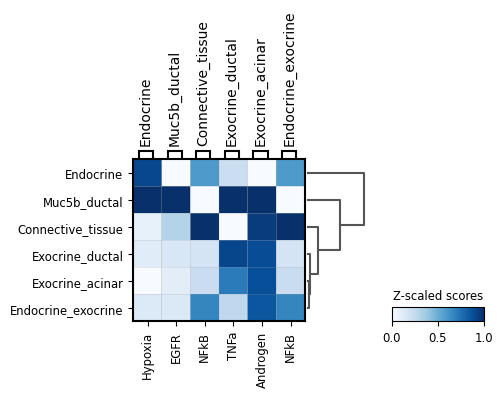

In [25]:
sc.pl.matrixplot(acts, source_markers, 'Niche_label', standard_scale='var',dendrogram=True,
                 colorbar_title='Z-scaled scores', cmap='Blues', save='Pathway_per_niche_label.pdf')

In [26]:
df_cond = dc.rank_sources_groups(acts, groupby='condition', reference='rest', method='t-test_overestim_var')
n_markers = 5
source_markers_cond = df_cond.groupby('group').head(n_markers).groupby('group')['names'].apply(lambda x: list(x)).to_dict()
source_markers_cond

{'ND': ['PI3K', 'VEGF', 'WNT', 'NFkB', 'EGFR'],
 'T1D': ['TNFa', 'Estrogen', 'JAK-STAT', 'Trail', 'Hypoxia']}

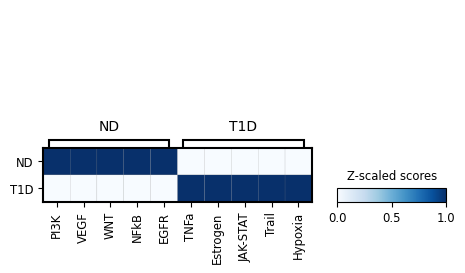

In [27]:
sc.pl.matrixplot(acts, source_markers_cond, 'condition', standard_scale='var',dendrogram=True,
                 colorbar_title='Z-scaled scores', cmap='Blues',save='Pathway_per_cond_label.pdf')

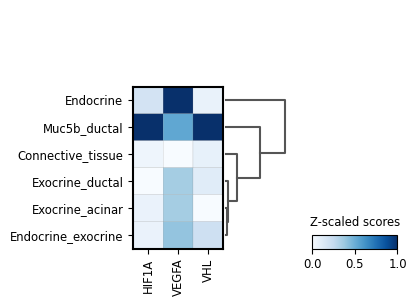

In [85]:
sc.pl.matrixplot(adata, ['HIF1A',	'VEGFA',	'VHL'], 'Niche_label', standard_scale='var',dendrogram=True,
                 colorbar_title='Z-scaled scores', cmap='Blues')

In [28]:
adata

AnnData object with n_obs × n_vars = 386727 × 979
    obs: 'fov', 'Area', 'AspectRatio', 'CenterX_global_px', 'CenterY_global_px', 'Width', 'Height', 'Mean.MembraneStain', 'Max.MembraneStain', 'Mean.PanCK', 'Max.PanCK', 'Mean.GCG', 'Max.GCG', 'Mean.CD3', 'Max.CD3', 'Mean.DAPI', 'Max.DAPI', 'cell_ID', 'condition', 'slide', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_NegPrb', 'log1p_total_counts_NegPrb', 'pct_counts_NegPrb', 'n_genes', 'cell_type_coarse', 'CellTypes_max', 'donor', 'cell_type', 'leiden_covet_0.2', 'Niche_label', 'fov_unique'
    uns: 'CellTypes_max_colors', 'Niche_label_colors', 'cell_type_coarse_colors', 'hvg', 'leiden_covet_0.2', 'n_neighbors=30', 'neighbors', 'pca', 'spatial', 'spatial_neighbors', 'dendrogram_Niche_label'
    obsm: 'X_pca', 'X_umap', 'covet-n_neighbors=30', 'covet_sqrt-n_neigh

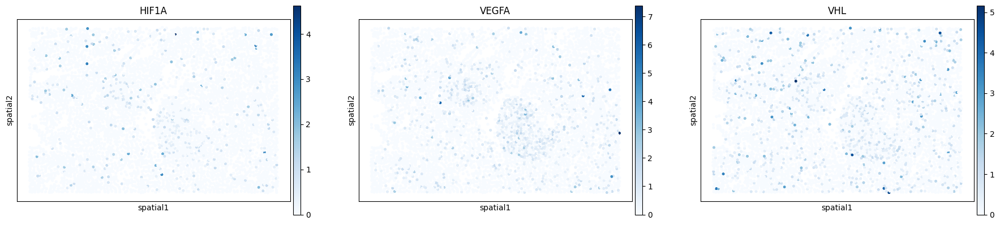

In [29]:
# Check how the TF activities look like
sq.pl.spatial_scatter(
    adata[adata.obs['fov_unique'] == '12_Run5211_S1'],
    color = ['HIF1A',	'VEGFA',	'VHL'],
    #groups = ['Endocrine'],
    spatial_key = 'spatial',
    shape=None,
    cmap='Blues',
    ncols=3,
    #vmax="p99",
)

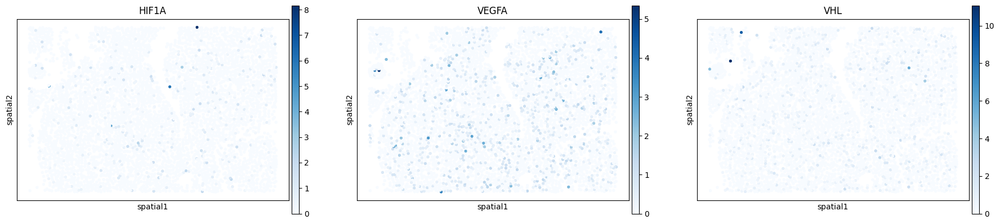

In [30]:
# Check how the TF activities look like
sq.pl.spatial_scatter(
    adata[adata.obs['fov_unique'] == '10_Run5211_S1'],
    color = ['HIF1A',	'VEGFA',	'VHL'],
    #groups = ['Endocrine'],
    spatial_key = 'spatial',
    shape=None,
    cmap='Blues',
    ncols=3,
    #vmax="p99",
)

In [20]:
df_ct = dc.rank_sources_groups(acts, groupby='CellTypes_max', reference='rest', method='t-test_overestim_var')
n_markers = 1
source_markers_ct = df_ct.groupby('group').head(n_markers).groupby('group')['names'].apply(lambda x: list(x)).to_dict()
source_markers_ct

{'Acinar_basal': ['NFkB'],
 'Acinar_highEnz': ['MAPK'],
 'Acinar_sigdiff': ['MAPK'],
 'Acinar_signal': ['MAPK'],
 'Activated_Stellate': ['TGFb'],
 'Alpha': ['Hypoxia'],
 'Beta': ['NFkB'],
 'Delta': ['JAK-STAT'],
 'Ductal': ['p53'],
 'Endothelial': ['JAK-STAT'],
 'MUC5b_Ductal': ['EGFR'],
 'Macrophage': ['JAK-STAT'],
 'Quiescent_Stellate': ['TGFb'],
 'Tcells': ['JAK-STAT']}

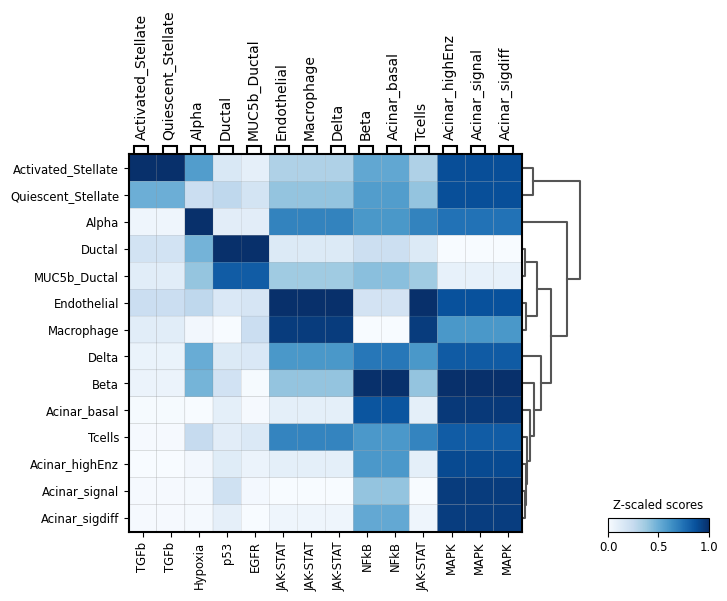

In [21]:
sc.pl.matrixplot(acts, source_markers_ct, 'CellTypes_max', standard_scale='var',dendrogram=True,
                 colorbar_title='Z-scaled scores', cmap='Blues')

### Focus on endocrine niche - pathway activity across condition with respect to distance  

For each slide we now want to calculate the distance of all observations to the closest endocrine niche. In addition we want to include the condition of the donors and the donor id in the resulting design matrix. 

#### all slides and fovs

In [22]:
acts.obs_names_make_unique()

In [23]:
len(acts.obs.fov_unique.cat.categories)

71

In [24]:
sq.tl.var_by_distance(
    adata=acts,
    groups="Endocrine",
    cluster_key="Niche_label",
    library_key="fov_unique",
    covariates=["condition", "donor"],
)

In [25]:
acts.obsm["design_matrix"]

,Niche_label,fov_unique,Endocrine,Endocrine_raw,condition,donor
1_1,Exocrine_ductal,1_Run5211_S1,0.057648,311.088412,T1D,Run5211_S1_T1D
2_1,Endocrine,1_Run5211_S1,NaN,0.000000,T1D,Run5211_S1_T1D
3_1,Endocrine,1_Run5211_S1,NaN,0.000000,T1D,Run5211_S1_T1D
4_1,Exocrine_ductal,1_Run5211_S1,0.028918,156.051274,T1D,Run5211_S1_T1D
5_1,Exocrine_ductal,1_Run5211_S1,0.043420,234.307490,T1D,Run5211_S1_T1D
...,...,...,...,...,...,...
7236_25,NaN,NaN,NaN,NaN,T1D,Run5211_S3_T1D
7237_25,NaN,NaN,NaN,NaN,T1D,Run5211_S3_T1D
7239_25,NaN,NaN,NaN,NaN,T1D,Run5211_S3_T1D
7240_25,NaN,NaN,NaN,NaN,T1D,Run5211_S3_T1D


In [26]:
acts.var_names

Index(['Androgen', 'EGFR', 'Estrogen', 'Hypoxia', 'JAK-STAT', 'MAPK', 'NFkB',
       'PI3K', 'TGFb', 'TNFa', 'Trail', 'VEGF', 'WNT', 'p53'],
      dtype='object')

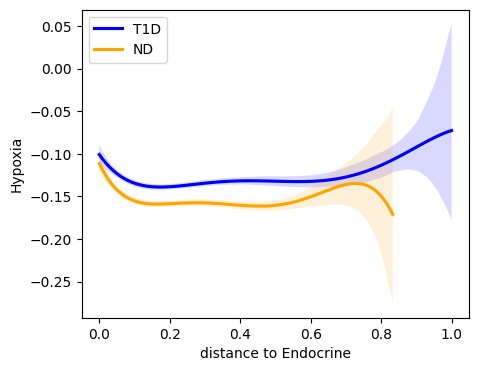

In [27]:
sq.pl.var_by_distance(
    adata=acts,
    design_matrix_key="design_matrix",
    var="Hypoxia",
    anchor_key="Endocrine",
    covariate="condition",
    line_palette=["blue", "orange"],
    show_scatter=False,
    figsize=(5, 4),
)

#### Representative fov per condition

In [39]:
acts_nd = acts[acts.obs['fov_unique'] == '12_Run5211_S1'].copy()
acts_t1 = acts[acts.obs['fov_unique'] == '2_Run5211_S1'].copy()

In [40]:
sq.tl.var_by_distance(
    adata=acts_nd,
    groups="Beta",
    cluster_key="CellTypes_max",
    library_key="fov_unique",
    covariates=["Niche_label"],
)

sq.tl.var_by_distance(
    adata=acts_t1,
    groups="Beta",
    cluster_key="CellTypes_max",
    library_key="fov_unique",
    covariates=["Niche_label"],
)

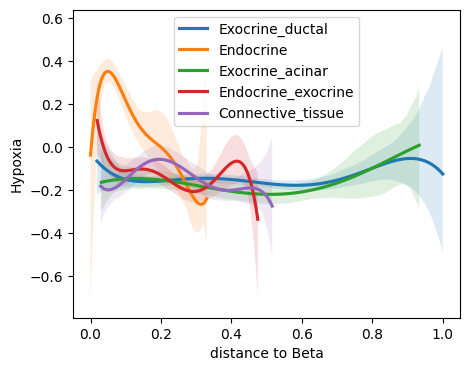

In [32]:
sq.pl.var_by_distance(
    adata=acts_nd,
    design_matrix_key="design_matrix",
    var="Hypoxia",
    anchor_key="Beta",
    covariate="Niche_label",
    #line_palette=["blue", "orange"],
    show_scatter=False,
    figsize=(5, 4),
)

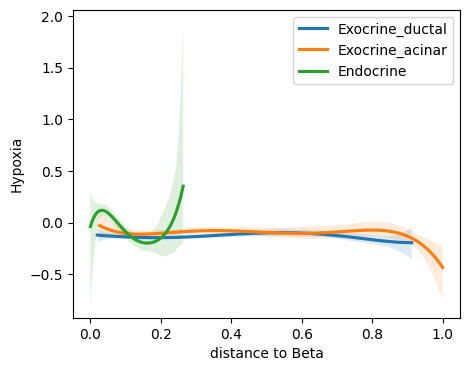

In [41]:
sq.pl.var_by_distance(
    adata=acts_t1,
    design_matrix_key="design_matrix",
    var="Hypoxia",
    anchor_key="Beta",
    covariate="Niche_label",
    #line_palette=["blue", "orange"],
    show_scatter=False,
    figsize=(5, 4),
)

/home/aih/sara.jimenez/miniconda3/envs/liana/lib/python3.9/site-packages/squidpy/pl/_color_utils.py:28: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
/home/aih/sara.jimenez/miniconda3/envs/liana/lib/python3.9/site-packages/squidpy/pl/_spatial_utils.py:946: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored


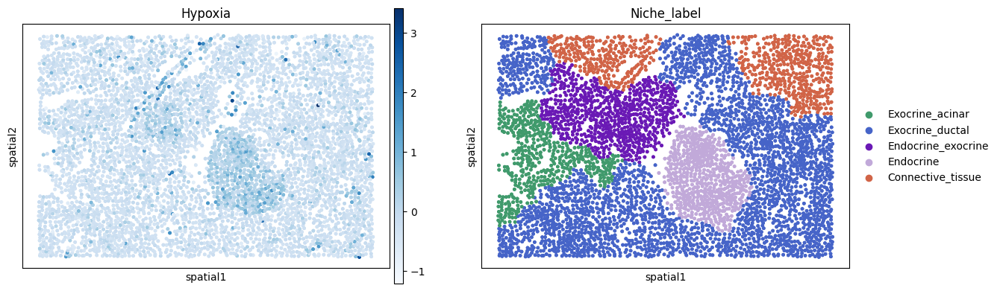

In [34]:
# Check how the TF activities look like
sq.pl.spatial_scatter(
    acts[acts.obs['fov_unique'] == '12_Run5211_S1'],
    color = ['Hypoxia', 'Niche_label'],
    #groups = ['Endocrine'],
    spatial_key = 'spatial',
    shape=None,
    cmap='Blues',
    ncols=6,
    #vmax="p99",
)

/home/aih/sara.jimenez/miniconda3/envs/liana/lib/python3.9/site-packages/squidpy/pl/_color_utils.py:28: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
/home/aih/sara.jimenez/miniconda3/envs/liana/lib/python3.9/site-packages/squidpy/pl/_spatial_utils.py:946: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored


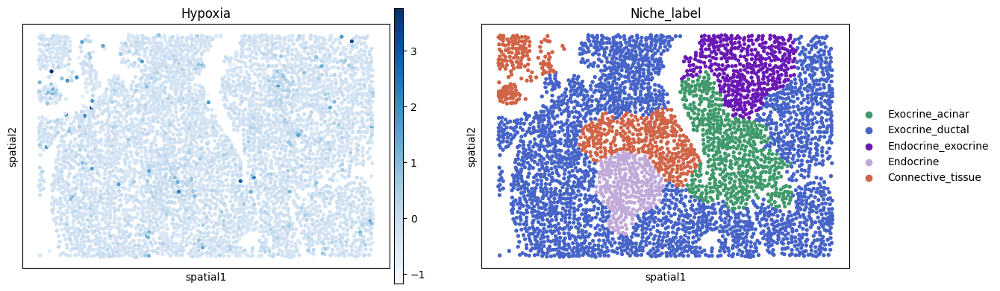

In [35]:
# Check how the TF activities look like
sq.pl.spatial_scatter(
    acts[acts.obs['fov_unique'] == '10_Run5211_S1'],
    color = ['Hypoxia', 'Niche_label'],
    #groups = ['Endocrine'],
    spatial_key = 'spatial',
    shape=None,
    cmap='Blues',
    ncols=6,
    #vmax="p99",
)

### Spatially variable Pathways

In [55]:
acts.obsp['spatial_connectivities'] = adata.obsp['spatial_connectivities']

In [63]:
df_svg = sq.gr.spatial_autocorr(acts,
                                mode="moran",
                                n_perms=100,
                                n_jobs=4,
                                seed=0,
                                copy=True
                               )
acts


100%|██████████| 100/100 [03:24<00:00,  2.05s/]


AnnData object with n_obs × n_vars = 386727 × 14
    obs: 'fov', 'Area', 'AspectRatio', 'CenterX_global_px', 'CenterY_global_px', 'Width', 'Height', 'Mean.MembraneStain', 'Max.MembraneStain', 'Mean.PanCK', 'Max.PanCK', 'Mean.GCG', 'Max.GCG', 'Mean.CD3', 'Max.CD3', 'Mean.DAPI', 'Max.DAPI', 'cell_ID', 'condition', 'slide', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_NegPrb', 'log1p_total_counts_NegPrb', 'pct_counts_NegPrb', 'n_genes', 'cell_type_coarse', 'CellTypes_max', 'donor', 'cell_type', 'leiden_covet_0.2', 'Niche_label', 'fov_unique'
    uns: 'CellTypes_max_colors', 'Niche_label_colors', 'cell_type_coarse_colors', 'hvg', 'leiden_covet_0.2', 'n_neighbors=30', 'neighbors', 'pca', 'spatial', 'spatial_neighbors', 'design_matrix'
    obsm: 'X_pca', 'X_umap', 'covet-n_neighbors=30', 'covet_sqrt-n_neighbors=30', 

In [74]:
df_svg

,I,pval_norm,var_norm,pval_z_sim,pval_sim,var_sim,pval_norm_fdr_bh,pval_z_sim_fdr_bh,pval_sim_fdr_bh
TNFa,0.386870,0.0,2.185952e-07,0.0,0.009901,1.173106e-06,0.0,0.0,0.009901
NFkB,0.290469,0.0,2.185952e-07,0.0,0.009901,1.042478e-06,0.0,0.0,0.009901
Androgen,0.255256,0.0,2.185952e-07,0.0,0.009901,6.954364e-07,0.0,0.0,0.009901
TGFb,0.123301,0.0,2.185952e-07,0.0,0.009901,3.241610e-07,0.0,0.0,0.009901
VEGF,0.108992,0.0,2.185952e-07,0.0,0.009901,3.724398e-07,0.0,0.0,0.009901
JAK-STAT,0.099934,0.0,2.185952e-07,0.0,0.009901,2.857286e-07,0.0,0.0,0.009901
Trail,0.062144,0.0,2.185952e-07,0.0,0.009901,2.758393e-07,0.0,0.0,0.009901
PI3K,0.059128,0.0,2.185952e-07,0.0,0.009901,2.501088e-07,0.0,0.0,0.009901
EGFR,0.053502,0.0,2.185952e-07,0.0,0.009901,1.839063e-07,0.0,0.0,0.009901
WNT,0.052357,0.0,2.185952e-07,0.0,0.009901,2.259568e-07,0.0,0.0,0.009901


/home/aih/sara.jimenez/miniconda3/envs/liana/lib/python3.9/site-packages/squidpy/pl/_color_utils.py:28: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.


/home/aih/sara.jimenez/miniconda3/envs/liana/lib/python3.9/site-packages/squidpy/pl/_spatial_utils.py:946: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored


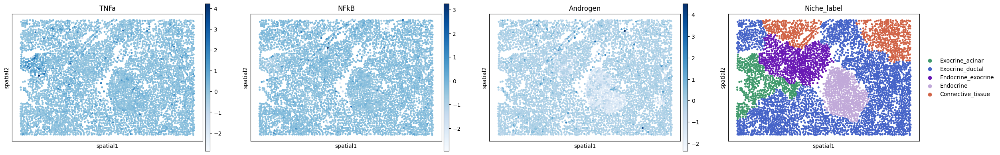

In [77]:
# Check how the TF activities look like
sq.pl.spatial_scatter(
    acts[acts.obs['fov_unique'] == '12_Run5211_S1'],
    color = ['TNFa','NFkB','Androgen','Niche_label'],
    #groups = ['Endocrine'],
    spatial_key = 'spatial',
    shape=None,
    cmap='Blues',
    ncols=6,
    #vmax="p99",
)

/home/aih/sara.jimenez/miniconda3/envs/liana/lib/python3.9/site-packages/squidpy/pl/_color_utils.py:28: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
/home/aih/sara.jimenez/miniconda3/envs/liana/lib/python3.9/site-packages/squidpy/pl/_spatial_utils.py:946: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored


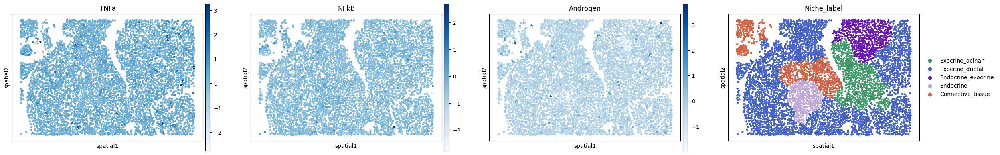

In [78]:
# Check how the TF activities look like
sq.pl.spatial_scatter(
    acts[acts.obs['fov_unique'] == '10_Run5211_S1'],
    color = ['TNFa','NFkB','Androgen','Niche_label'],
    #groups = ['Endocrine'],
    spatial_key = 'spatial',
    shape=None,
    cmap='Blues',
    ncols=6,
    #vmax="p99",
)

### Functional enrichment of bio terms

In [112]:
msigdb = dc.get_resource('MSigDB')
msigdb

,genesymbol,collection,geneset
0,MAFF,chemical_and_genetic_perturbations,BOYAULT_LIVER_CANCER_SUBCLASS_G56_DN
1,MAFF,chemical_and_genetic_perturbations,ELVIDGE_HYPOXIA_UP
2,MAFF,chemical_and_genetic_perturbations,NUYTTEN_NIPP1_TARGETS_DN
3,MAFF,immunesigdb,GSE17721_POLYIC_VS_GARDIQUIMOD_4H_BMDC_DN
4,MAFF,chemical_and_genetic_perturbations,SCHAEFFER_PROSTATE_DEVELOPMENT_12HR_UP
...,...,...,...
3838543,PRAMEF22,go_biological_process,GOBP_POSITIVE_REGULATION_OF_CELL_POPULATION_PR...
3838544,PRAMEF22,go_biological_process,GOBP_APOPTOTIC_PROCESS
3838545,PRAMEF22,go_biological_process,GOBP_REGULATION_OF_CELL_DEATH
3838546,PRAMEF22,go_biological_process,GOBP_NEGATIVE_REGULATION_OF_DEVELOPMENTAL_PROCESS


In [88]:
msigdb['collection'].cat.categories

Index(['biocarta_pathways', 'cancer_gene_neighborhoods', 'cancer_modules',
       'cell_type_signatures', 'chemical_and_genetic_perturbations',
       'go_biological_process', 'go_cellular_component',
       'go_molecular_function', 'hallmark', 'human_phenotype_ontology',
       'immunesigdb', 'kegg_pathways', 'mirna_targets_legacy',
       'mirna_targets_mirdb', 'oncogenic_signatures', 'pid_pathways',
       'positional', 'reactome_pathways', 'tf_targets_gtrf',
       'tf_targets_legacy', 'vaccine_response', 'wikipathways'],
      dtype='string')

In [113]:
msigdb = msigdb[msigdb['collection']=='reactome_pathways']
msigdb

,genesymbol,collection,geneset
200,MAFF,reactome_pathways,REACTOME_HEMOSTASIS
342,MAFF,reactome_pathways,REACTOME_FACTORS_INVOLVED_IN_MEGAKARYOCYTE_DEV...
718,IER3,reactome_pathways,REACTOME_INTRACELLULAR_SIGNALING_BY_SECOND_MES...
859,IER3,reactome_pathways,REACTOME_NEGATIVE_REGULATION_OF_THE_PI3K_AKT_N...
1104,PHLDA1,reactome_pathways,REACTOME_MITOTIC_G2_G2_M_PHASES
...,...,...,...
3838483,KIR2DS2,reactome_pathways,REACTOME_DAP12_INTERACTIONS
3838489,KIR2DS2,reactome_pathways,REACTOME_INNATE_IMMUNE_SYSTEM
3838499,KIR2DS2,reactome_pathways,REACTOME_ADAPTIVE_IMMUNE_SYSTEM
3838530,KIR3DS1,reactome_pathways,REACTOME_DAP12_INTERACTIONS


In [114]:
# Filter by hallmark
msigdb = msigdb[msigdb['collection']=='reactome_pathways']

# Remove duplicated entries
msigdb = msigdb[~msigdb.duplicated(['geneset', 'genesymbol'])]

# Rename
msigdb.loc[:, 'geneset'] = [name.split('REACTOME_')[1] for name in msigdb['geneset']]

msigdb

IndexError: list index out of range

#### Enrichment with Over Representation analysis (ORA)

In [92]:
dc.run_ora(
    mat=adata,
    net=msigdb,
    source='geneset',
    target='genesymbol',
    verbose=True,
    use_raw=False
)

# Store in a different key
adata.obsm['msigdb_ora_estimate'] = adata.obsm['ora_estimate'].copy()
adata.obsm['msigdb_ora_pvals'] = adata.obsm['ora_pvals'].copy()

Running ora on mat with 386727 samples and 979 targets for 88 sources.



100%|██████████| 386727/386727 [01:10<00:00, 5454.42it/s]


In [93]:
adata.obsm['msigdb_ora_estimate']

source,ACUTE_MYELOID_LEUKEMIA,ADHERENS_JUNCTION,ADIPOCYTOKINE_SIGNALING_PATHWAY,ALDOSTERONE_REGULATED_SODIUM_REABSORPTION,ALLOGRAFT_REJECTION,ALZHEIMERS_DISEASE,AMYOTROPHIC_LATERAL_SCLEROSIS_ALS,ANTIGEN_PROCESSING_AND_PRESENTATION,APOPTOSIS,ARACHIDONIC_ACID_METABOLISM,...,THYROID_CANCER,TIGHT_JUNCTION,TOLL_LIKE_RECEPTOR_SIGNALING_PATHWAY,TYPE_II_DIABETES_MELLITUS,TYPE_I_DIABETES_MELLITUS,T_CELL_RECEPTOR_SIGNALING_PATHWAY,VASCULAR_SMOOTH_MUSCLE_CONTRACTION,VEGF_SIGNALING_PATHWAY,VIRAL_MYOCARDITIS,WNT_SIGNALING_PATHWAY
1_1,-0.000000,1.319679,-0.000000,1.913949,2.735032,-0.000000,-0.000000,2.841759,-0.000000,-0.000000,...,-0.000000,1.660758,2.408093,1.835288,4.461750,2.670780,-0.000000,1.537379,2.555502,-0.000000
2_1,-0.000000,2.964089,1.341438,4.232644,1.208840,-0.000000,1.471470,2.841759,6.271412,1.660758,...,-0.000000,-0.000000,1.050218,4.057233,2.735032,1.177689,-0.000000,-0.000000,1.121761,2.611139
3_1,1.503136,4.815326,3.009167,1.913949,1.208840,1.574648,3.279724,2.841759,4.411346,-0.000000,...,1.660758,1.660758,1.050218,1.835288,2.735032,1.177689,-0.000000,1.537379,4.185732,-0.000000
4_1,-0.000000,-0.000000,1.341438,4.232644,-0.000000,-0.000000,1.471470,1.260535,2.702286,-0.000000,...,-0.000000,-0.000000,2.408093,1.835288,1.208840,2.670780,-0.000000,3.417862,-0.000000,-0.000000
5_1,1.503136,1.319679,-0.000000,1.913949,1.208840,1.574648,-0.000000,4.626259,-0.000000,-0.000000,...,1.660758,1.660758,2.408093,1.835288,2.735032,1.177689,7.505087,-0.000000,1.121761,1.148758
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7236_25,-0.000000,1.319679,-0.000000,-0.000000,1.208840,-0.000000,-0.000000,2.841759,-0.000000,-0.000000,...,-0.000000,-0.000000,-0.000000,-0.000000,1.208840,1.177689,1.471470,1.537379,2.555502,-0.000000
7237_25,1.503136,1.319679,-0.000000,-0.000000,1.208840,-0.000000,-0.000000,2.841759,-0.000000,-0.000000,...,-0.000000,-0.000000,-0.000000,-0.000000,1.208840,1.177689,1.471470,-0.000000,2.555502,1.148758
7239_25,3.345991,1.319679,-0.000000,-0.000000,1.208840,-0.000000,-0.000000,2.841759,1.192967,-0.000000,...,-0.000000,-0.000000,-0.000000,-0.000000,1.208840,1.177689,1.471470,-0.000000,2.555502,1.148758
7240_25,1.503136,2.964089,-0.000000,-0.000000,1.208840,-0.000000,-0.000000,2.841759,-0.000000,-0.000000,...,-0.000000,-0.000000,-0.000000,-0.000000,1.208840,1.177689,1.471470,-0.000000,2.555502,1.148758


In [99]:
adata.obsm['msigdb_ora_pvals']

source,ACUTE_MYELOID_LEUKEMIA,ADHERENS_JUNCTION,ADIPOCYTOKINE_SIGNALING_PATHWAY,ALDOSTERONE_REGULATED_SODIUM_REABSORPTION,ALLOGRAFT_REJECTION,ALZHEIMERS_DISEASE,AMYOTROPHIC_LATERAL_SCLEROSIS_ALS,ANTIGEN_PROCESSING_AND_PRESENTATION,APOPTOSIS,ARACHIDONIC_ACID_METABOLISM,...,THYROID_CANCER,TIGHT_JUNCTION,TOLL_LIKE_RECEPTOR_SIGNALING_PATHWAY,TYPE_II_DIABETES_MELLITUS,TYPE_I_DIABETES_MELLITUS,T_CELL_RECEPTOR_SIGNALING_PATHWAY,VASCULAR_SMOOTH_MUSCLE_CONTRACTION,VEGF_SIGNALING_PATHWAY,VIRAL_MYOCARDITIS,WNT_SIGNALING_PATHWAY
1_1,1.000000,0.047898,1.000000,0.012191,0.001841,1.000000,1.000000,0.001440,1.000000e+00,1.000000,...,1.000000,0.021839,0.003908,0.014612,0.000035,0.002134,1.000000e+00,0.029015,0.002783,1.000000
2_1,1.000000,0.001086,0.045558,0.000059,0.061824,1.000000,0.033770,0.001440,5.352880e-07,0.021839,...,1.000000,1.000000,0.089080,0.000088,0.001841,0.066422,1.000000e+00,1.000000,0.075551,0.002448
3_1,0.031395,0.000015,0.000979,0.012191,0.061824,0.026629,0.000525,0.001440,3.878411e-05,1.000000,...,0.021839,0.021839,0.089080,0.014612,0.001841,0.066422,1.000000e+00,0.029015,0.000065,1.000000
4_1,1.000000,1.000000,0.045558,0.000059,1.000000,1.000000,0.033770,0.054886,1.984787e-03,1.000000,...,1.000000,1.000000,0.003908,0.014612,0.061824,0.002134,1.000000e+00,0.000382,1.000000,1.000000
5_1,0.031395,0.047898,1.000000,0.012191,0.061824,0.026629,1.000000,0.000024,1.000000e+00,1.000000,...,0.021839,0.021839,0.003908,0.014612,0.001841,0.066422,3.125451e-08,1.000000,0.075551,0.070997
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7236_25,1.000000,0.047898,1.000000,1.000000,0.061824,1.000000,1.000000,0.001440,1.000000e+00,1.000000,...,1.000000,1.000000,1.000000,1.000000,0.061824,0.066422,3.376989e-02,0.029015,0.002783,1.000000
7237_25,0.031395,0.047898,1.000000,1.000000,0.061824,1.000000,1.000000,0.001440,1.000000e+00,1.000000,...,1.000000,1.000000,1.000000,1.000000,0.061824,0.066422,3.376989e-02,1.000000,0.002783,0.070997
7239_25,0.000451,0.047898,1.000000,1.000000,0.061824,1.000000,1.000000,0.001440,6.412589e-02,1.000000,...,1.000000,1.000000,1.000000,1.000000,0.061824,0.066422,3.376989e-02,1.000000,0.002783,0.070997
7240_25,0.031395,0.001086,1.000000,1.000000,0.061824,1.000000,1.000000,0.001440,1.000000e+00,1.000000,...,1.000000,1.000000,1.000000,1.000000,0.061824,0.066422,3.376989e-02,1.000000,0.002783,0.070997


In [95]:
adata.obs_names_make_unique()

In [97]:
acts_ora = dc.get_acts(adata, obsm_key='msigdb_ora_estimate')

# We need to remove inf and set them to the maximum value observed
acts_v = acts_ora.X.ravel()
max_e = np.nanmax(acts_v[np.isfinite(acts_v)])
acts_ora.X[~np.isfinite(acts_ora.X)] = max_e

acts_ora

AnnData object with n_obs × n_vars = 386727 × 88
    obs: 'fov', 'Area', 'AspectRatio', 'CenterX_global_px', 'CenterY_global_px', 'Width', 'Height', 'Mean.MembraneStain', 'Max.MembraneStain', 'Mean.PanCK', 'Max.PanCK', 'Mean.GCG', 'Max.GCG', 'Mean.CD3', 'Max.CD3', 'Mean.DAPI', 'Max.DAPI', 'cell_ID', 'condition', 'slide', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_NegPrb', 'log1p_total_counts_NegPrb', 'pct_counts_NegPrb', 'n_genes', 'cell_type_coarse', 'CellTypes_max', 'donor', 'cell_type', 'leiden_covet_0.2', 'Niche_label', 'fov_unique'
    uns: 'CellTypes_max_colors', 'Niche_label_colors', 'cell_type_coarse_colors', 'hvg', 'leiden_covet_0.2', 'n_neighbors=30', 'neighbors', 'pca', 'spatial', 'spatial_neighbors', 'design_matrix', 'dendrogram_Niche_label', 'dendrogram_CellTypes_max'
    obsm: 'X_pca', 'X_umap',

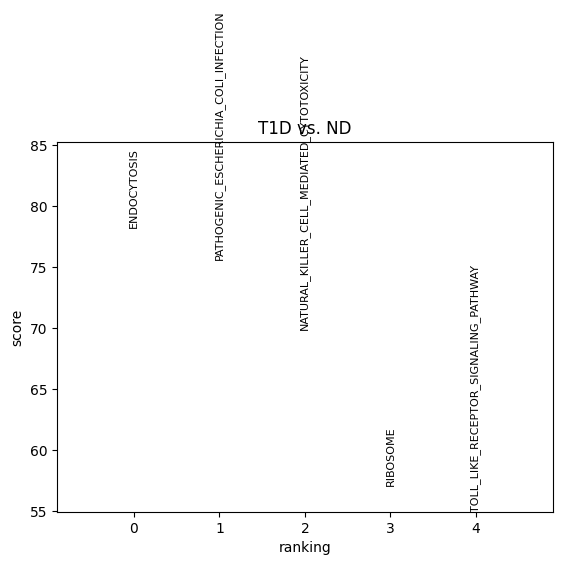

In [117]:
sc.tl.rank_genes_groups(acts_ora, "condition", groups=["T1D"], reference="ND", method="wilcoxon")
sc.pl.rank_genes_groups(acts_ora, groups=["T1D"], n_genes=5)

/home/aih/sara.jimenez/miniconda3/envs/liana/lib/python3.9/site-packages/scanpy/plotting/_tools/__init__.py:1303: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.


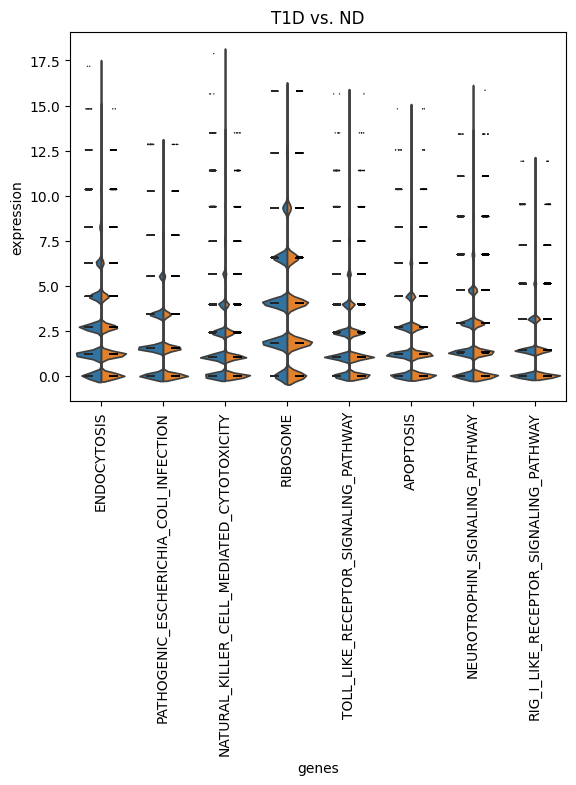

In [118]:
sc.pl.rank_genes_groups_violin(acts_ora, groups="T1D", n_genes=8)

In [101]:
acts_ora.var_names

Index(['ACUTE_MYELOID_LEUKEMIA', 'ADHERENS_JUNCTION',
       'ADIPOCYTOKINE_SIGNALING_PATHWAY',
       'ALDOSTERONE_REGULATED_SODIUM_REABSORPTION', 'ALLOGRAFT_REJECTION',
       'ALZHEIMERS_DISEASE', 'AMYOTROPHIC_LATERAL_SCLEROSIS_ALS',
       'ANTIGEN_PROCESSING_AND_PRESENTATION', 'APOPTOSIS',
       'ARACHIDONIC_ACID_METABOLISM',
       'ARRHYTHMOGENIC_RIGHT_VENTRICULAR_CARDIOMYOPATHY_ARVC', 'ASTHMA',
       'AUTOIMMUNE_THYROID_DISEASE', 'AXON_GUIDANCE', 'BASAL_CELL_CARCINOMA',
       'BLADDER_CANCER', 'B_CELL_RECEPTOR_SIGNALING_PATHWAY',
       'CALCIUM_SIGNALING_PATHWAY', 'CELL_ADHESION_MOLECULES_CAMS',
       'CELL_CYCLE', 'CHEMOKINE_SIGNALING_PATHWAY', 'CHRONIC_MYELOID_LEUKEMIA',
       'COLORECTAL_CANCER', 'COMPLEMENT_AND_COAGULATION_CASCADES',
       'CYTOKINE_CYTOKINE_RECEPTOR_INTERACTION',
       'CYTOSOLIC_DNA_SENSING_PATHWAY', 'DILATED_CARDIOMYOPATHY',
       'DORSO_VENTRAL_AXIS_FORMATION', 'ECM_RECEPTOR_INTERACTION',
       'ENDOCYTOSIS', 'ENDOMETRIAL_CANCER',
       'EPIT

In [102]:
to_plot = {
    'Alpha':'ANTIGEN_PROCESSING_AND_PRESENTATION',#increased in t1d
    'Delta':['HEDGEHOG_SIGNALING_PATHWAY','CELL_CYCLE'], #increased in t1d
    'Endothelial':['JAK_STAT_SIGNALING_PATHWAY']
    
}

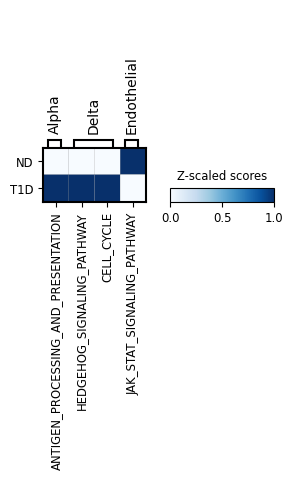

In [104]:
sc.pl.matrixplot(acts_ora, var_names=to_plot, groupby='condition', dendrogram=True, standard_scale='var',
                 colorbar_title='Z-scaled scores', cmap='Blues')

/home/aih/sara.jimenez/miniconda3/envs/liana/lib/python3.9/site-packages/squidpy/pl/_color_utils.py:28: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
/home/aih/sara.jimenez/miniconda3/envs/liana/lib/python3.9/site-packages/squidpy/pl/_spatial_utils.py:946: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored


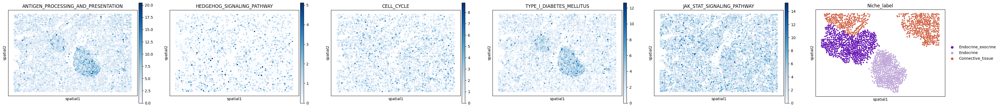

In [110]:
# Check how the TF activities look like
sq.pl.spatial_scatter(
    acts_ora[acts_ora.obs['fov_unique'] == '12_Run5211_S1'],
    color = ['ANTIGEN_PROCESSING_AND_PRESENTATION','HEDGEHOG_SIGNALING_PATHWAY','CELL_CYCLE','TYPE_I_DIABETES_MELLITUS','JAK_STAT_SIGNALING_PATHWAY','Niche_label'],
    groups = ['Endocrine','Endocrine_exocrine','Connective_tissue'],
    spatial_key = 'spatial',
    shape=None,
    cmap='Blues',
    ncols=6,
    #vmax="p99",
)

/home/aih/sara.jimenez/miniconda3/envs/liana/lib/python3.9/site-packages/squidpy/pl/_color_utils.py:28: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
/home/aih/sara.jimenez/miniconda3/envs/liana/lib/python3.9/site-packages/squidpy/pl/_spatial_utils.py:946: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored


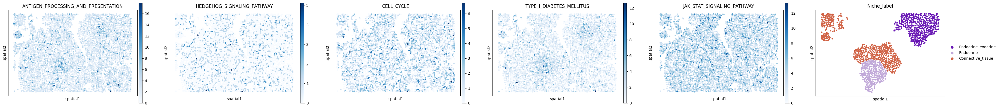

In [109]:
# Check how the TF activities look like
sq.pl.spatial_scatter(
    acts_ora[acts_ora.obs['fov_unique'] == '10_Run5211_S1'],
    color = ['ANTIGEN_PROCESSING_AND_PRESENTATION','HEDGEHOG_SIGNALING_PATHWAY','CELL_CYCLE','TYPE_I_DIABETES_MELLITUS','JAK_STAT_SIGNALING_PATHWAY','Niche_label'],
    groups = ['Endocrine','Endocrine_exocrine','Connective_tissue'],
    spatial_key = 'spatial',
    shape=None,
    cmap='Blues',
    ncols=6,
    #vmax="p99",
)